In [1]:
import model_backbone
import datasets
import glimpse
from datasets import FILE_PATH

import tensorflow as tf
from IPython.display import Image
from IPython.display import display

In [5]:
save_file = '/{}/model_checkpoints/PAR_TRAN_FIX_3.h5'.format(FILE_PATH)
num_classes = 10
augment = True
shared = False
restricted_attention = True
num_transformers = 5

def build_model():
        return model_backbone.parallel_transformers(num_classes=num_classes, augment=augment, num_transformers=num_transformers, shared=shared, restricted_attention=restricted_attention)

model = build_model()
model.load_weights(save_file, by_name=False)

model.summary()

Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           [(None, 320, 320, 3) 0                                            
__________________________________________________________________________________________________
image_augmentation (Lambda)     (None, 320, 320, 3)  0           input_17[0][0]                   
__________________________________________________________________________________________________
gaze_layer_1 (GazeLayer)        (10, None)           11200458    image_augmentation[0][0]         
__________________________________________________________________________________________________
tf_op_layer_mul_1 (TensorFlowOp [(10, None)]         0           gaze_layer_1[0][0]               
___________________________________________________________________________________________

In [6]:
batch_size = 32
train_dataset, test_dataset = datasets.load_imagenet(data_dir='imagenet10', only_test=True, batch_size=batch_size)
num_test_samples = 500

In [7]:
img_paths = []
img_ind = 0
for x_test, _ in test_dataset:
        img = tf.reshape(x_test[1], [1, 320, 320, 3])
        gaze = tf.keras.Model(model.inputs, model.layers[2].output)(img)
        print(gaze)

        for i in range(num_transformers):
                warped = glimpse.warp_image_multi_gaze(img, 320, 320, gaze[i*2:(i+1)*2, :] * 160)
                img_path = '{}/images/test-{}-{}.png'.format(FILE_PATH, img_ind, i)
                tf.keras.preprocessing.image.save_img(img_path, warped[0])
                img_paths.append(img_path)

        img_ind += batch_size

tf.Tensor(
[[ 1.       ]
 [-1.       ]
 [ 1.       ]
 [ 1.       ]
 [-1.       ]
 [-1.       ]
 [-1.       ]
 [-1.       ]
 [ 1.       ]
 [ 0.9999996]], shape=(10, 1), dtype=float32)
tf.Tensor(
[[ 1.]
 [-1.]
 [ 1.]
 [ 1.]
 [-1.]
 [-1.]
 [-1.]
 [-1.]
 [ 1.]
 [ 1.]], shape=(10, 1), dtype=float32)
tf.Tensor(
[[ 1.]
 [-1.]
 [ 1.]
 [ 1.]
 [-1.]
 [-1.]
 [-1.]
 [-1.]
 [ 1.]
 [ 1.]], shape=(10, 1), dtype=float32)
tf.Tensor(
[[ 1.        ]
 [-1.        ]
 [ 1.        ]
 [ 1.        ]
 [-1.        ]
 [-1.        ]
 [-1.        ]
 [-1.        ]
 [ 0.99999994]
 [ 0.9999975 ]], shape=(10, 1), dtype=float32)
tf.Tensor(
[[ 1.]
 [-1.]
 [ 1.]
 [ 1.]
 [-1.]
 [-1.]
 [-1.]
 [-1.]
 [ 1.]
 [ 1.]], shape=(10, 1), dtype=float32)
tf.Tensor(
[[ 1.]
 [-1.]
 [ 1.]
 [ 1.]
 [-1.]
 [-1.]
 [-1.]
 [-1.]
 [ 1.]
 [ 1.]], shape=(10, 1), dtype=float32)
tf.Tensor(
[[ 1.        ]
 [-1.        ]
 [ 1.        ]
 [ 1.        ]
 [-1.        ]
 [-1.        ]
 [-1.        ]
 [-1.        ]
 [ 1.        ]
 [ 0.99999994]], shape=(10

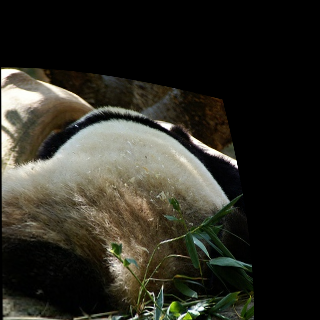

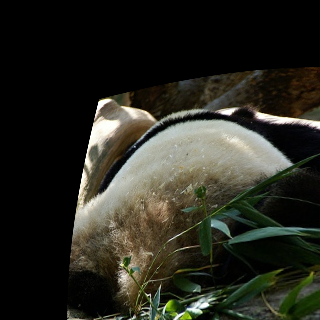

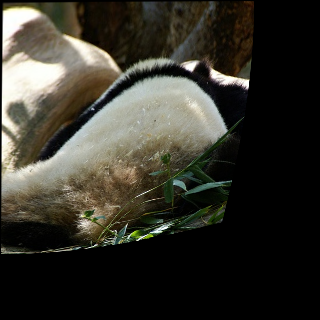

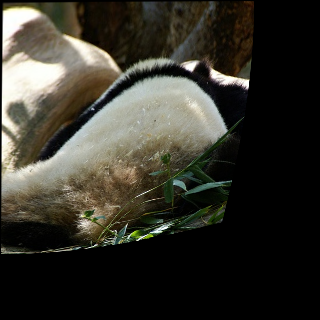

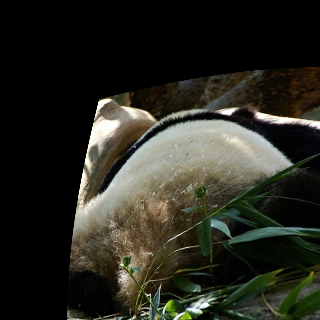

...

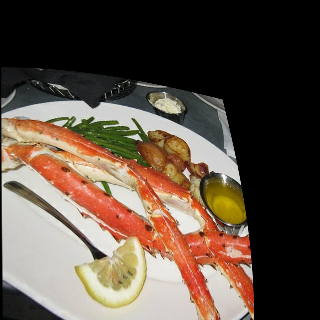

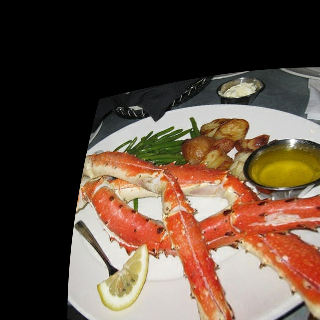

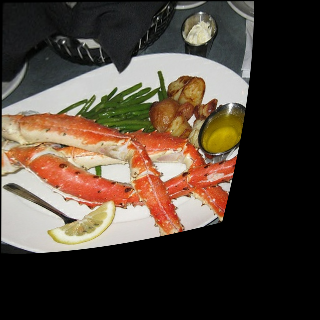

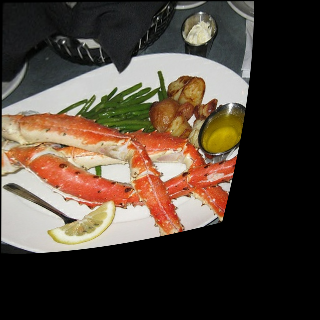

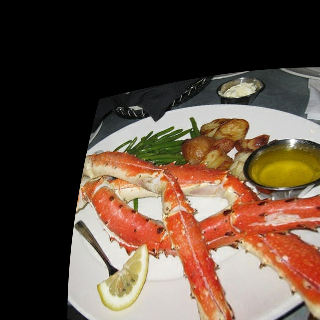

In [8]:
imgs = [Image(path, width = 300) for path in img_paths]
display(*imgs)

In [ ]:
def save_transformed_images():
        colors = tf.constant([[1.0, 0.0, 0.0], [0.0, 1.0, 0.0], [0.0, 0.0, 1.0], [1.0, 0.0, 1.0], [1.0, 1.0, 0.0]])
        img_ind = 0
        
        for x_test, _ in test_dataset:
                boxes = []
                img = tf.reshape(x_test[0], [1, 320, 320, 3])

                for i in range(num_transformers):
                        transformer = tf.keras.Model(model.inputs, model.get_layer(f'transformer-{i}').output)
                        img_new, box, center = transformer(img)

                        img_new = tf.reshape(img_new, [320, 320, 3])
                        tf.keras.preprocessing.image.save_img('{}/images/test-{}-{}.png'.format(FILE_PATH, img_ind, i), img_new)

                        minx, maxx = min(box[1][0], box[3][0]).numpy(), max(box[1][0], box[3][0]).numpy()
                        miny, maxy = min(box[0][0], box[2][0]).numpy(), max(box[0][0], box[2][0]).numpy()
                        boxes.append([miny, minx, maxy, maxx])

                boxes = tf.reshape(tf.constant(boxes), (1, num_transformers, 4))
                img = tf.image.draw_bounding_boxes(img, boxes, colors)
                img = tf.reshape(img, [320, 320, 3])
                tf.keras.preprocessing.image.save_img('{}/images/test-{}.png'.format(FILE_PATH, img_ind), img)

                img_ind += batch_size